In this project, I want to visualize the impact of the thousands of data centers across the United States. I want to do this by creating a map showing how many data centers are within each county.

While digital storage is billed as clean and eco-friendly, the data still has to be stored in a phyiscal location. "Cloud" storage is a marketing term: those 1's and 0's still require space to be housed, and that water-guzzling home could be in your backyard. I want this map to spur the viewer to action.

Here I am importing the libraries needed to run this. Pandas is the base of this notebook, with geopandas being used to render the map. Matplotlib handles the other plotting, and "us" is a new library to me that I needed to convert the FIPs codes of the states into a word in order to match the two dataframes together.

In [5]:
import pandas as pd
import json as js
import geopandas as gpd
from matplotlib import pyplot as plt
import us
import numpy as np
from mpl_toolkits.axes_grid1 import make_axes_locatable

I rendered the .shp file for the first map to ensure that it worked properly

In [7]:
fp = r'cb_2018_us_county_500k.shp'

map_df = gpd.read_file(fp)

map_df.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry
0,21,007,00516850,0500000US21007,21007,Ballard,06,639387454,69473325,"POLYGON ((-89.18137 37.0463, -89.17938 37.0530..."
1,21,017,00516855,0500000US21017,21017,Bourbon,06,750439351,4829777,"POLYGON ((-84.44266 38.28324, -84.44114 38.283..."
2,21,031,00516862,0500000US21031,21031,Butler,06,1103571974,13943044,"POLYGON ((-86.94486 37.07341, -86.94346 37.074..."
3,21,065,00516879,0500000US21065,21065,Estill,06,655509930,6516335,"POLYGON ((-84.12662 37.6454, -84.12483 37.6461..."
4,21,069,00516881,0500000US21069,21069,Fleming,06,902727151,7182793,"POLYGON ((-83.98428 38.44549, -83.98246 38.450..."


<Axes: >

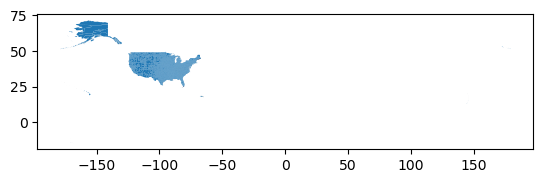

In [8]:
map_df.plot()

In [9]:
unique_students = map_df['STATEFP'].unique()

unique_students = np.sort(unique_students)

print(unique_students)

['01' '02' '04' '05' '06' '08' '09' '10' '11' '12' '13' '15' '16' '17'
 '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28' '29' '30' '31'
 '32' '33' '34' '35' '36' '37' '38' '39' '40' '41' '42' '44' '45' '46'
 '47' '48' '49' '50' '51' '53' '54' '55' '56' '60' '66' '69' '72' '78']


In [10]:
map_df = map_df[map_df['STATEFP'] != '60']
map_df = map_df[map_df['STATEFP'] != '66']
map_df = map_df[map_df['STATEFP'] != '69']
map_df = map_df[map_df['STATEFP'] != '72']
map_df = map_df[map_df['STATEFP'] != '78']

map_df = map_df[map_df['STATEFP'] != '02']
map_df = map_df[map_df['STATEFP'] != '15']

And here I adjust the sizing for it to be easily seen. I cropped out Alaska since it was not mapped where I got the data from.

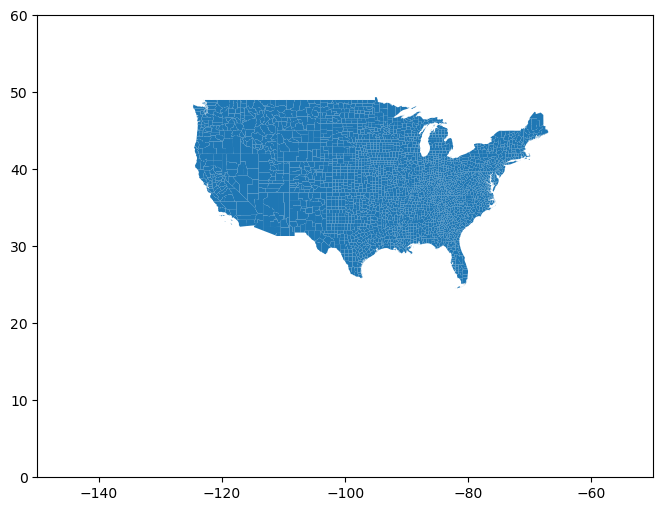

In [12]:
# Create a figure and an axes object
fig, ax = plt.subplots(figsize=(10, 6))

# Plot the shapefile
map_df.plot(ax=ax)

# Set desired axis limits
'''ax.set_xlim(-130, -65)
ax.set_ylim(20, 55)'''

ax.set_xlim(-150, -50)
ax.set_ylim(0, 60)

plt.show()

This is my data which includes the location of all of the datacenters in the continental US. This data is sourced from a Business Insider article. This data was web scraped using Excel, then downloaded as a .csv and uploaded here.

In [14]:
data = 'data_data.csv'

df = pd.read_csv(data, header=0)

df.head()

,Brand,State,County,Low,High,Note
0,Google,AL,Jackson,not disclosed,not disclosed,NaN
1,Meta,AL,Madison,not disclosed,not disclosed,NaN
2,Meta,AL,Madison,not disclosed,not disclosed,NaN
3,Walmart,AR,Benton,"6,442","10,307",NaN
4,11:11 Systems,AZ,Maricopa,"3,447","5,515",NaN


The dataframe with the map information uses "NAME" rather than "County", so I renamed it to match. This will make it easier when I merge the two dataframes later.

In [16]:
df.rename(columns={'County': 'NAME'}, inplace=True)

Now, I add in the state names. if you look back at the map_df dataframe, the column "STATEFP" has a two digit number. This is the code for the state. By using the "us" library, I can add on the state abbreviation for each row in the dataframe. Again, this is so it can be more easily identified and matched with the other dataframe.

In [18]:
fips_to_abbr = us.states.mapping("fips", "abbr")

map_df["state"] = map_df["STATEFP"].map(fips_to_abbr)

map_df.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,NAME,LSAD,ALAND,AWATER,geometry,state
0,21,007,00516850,0500000US21007,21007,Ballard,06,639387454,69473325,"POLYGON ((-89.18137 37.0463, -89.17938 37.0530...",KY
1,21,017,00516855,0500000US21017,21017,Bourbon,06,750439351,4829777,"POLYGON ((-84.44266 38.28324, -84.44114 38.283...",KY
2,21,031,00516862,0500000US21031,21031,Butler,06,1103571974,13943044,"POLYGON ((-86.94486 37.07341, -86.94346 37.074...",KY
3,21,065,00516879,0500000US21065,21065,Estill,06,655509930,6516335,"POLYGON ((-84.12662 37.6454, -84.12483 37.6461...",KY
4,21,069,00516881,0500000US21069,21069,Fleming,06,902727151,7182793,"POLYGON ((-83.98428 38.44549, -83.98246 38.450...",KY


This first block here counts every data center in each county. The original form had them separate: there could be four Google data centers in Lorain county, and one Meta, and each independent center was its own row. But since we want a heat map, we only need the total per county.

I considered using the power consumed, which is also data available. But for this project, I specifically wanted to focus on the physical space taken up by the centers, though power and water are important as well.

In [20]:
'''map_df['NAME'] = map_df['NAME'] + ' ' + map_df['state']
counts_df['NAME'] = counts_df['NAME'] + ' ' + counts_df['State']'''

"map_df['NAME'] = map_df['NAME'] + ' ' + map_df['state']\ncounts_df['NAME'] = counts_df['NAME'] + ' ' + counts_df['State']"

In [21]:
counts_series = df.groupby(['NAME', 'State']).size()

counts_df = counts_series.reset_index(name='Count')

This code appends the state name to the end of the county name. There was a problem matching later on with the two state columns, so it was just easier to add it to the name.

Finally, merging the data frames! This is done in a different way than i am used to (typically pd.merge()), but the join() preserves the geospatial data found in map_df. merged.fillna(0) fills all cells with no value with 0.

In [24]:
merged = map_df.set_index('NAME').join(counts_df.set_index('NAME'))

In [25]:
merged = merged.fillna(0)

merged.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,LSAD,ALAND,AWATER,geometry,state,State,Count
NAME,,,,,,,,,,,,
Ballard,21,007,00516850,0500000US21007,21007,06,639387454,69473325,"POLYGON ((-89.18137 37.0463, -89.17938 37.0530...",KY,0,0.0
Bourbon,21,017,00516855,0500000US21017,21017,06,750439351,4829777,"POLYGON ((-84.44266 38.28324, -84.44114 38.283...",KY,0,0.0
Butler,21,031,00516862,0500000US21031,21031,06,1103571974,13943044,"POLYGON ((-86.94486 37.07341, -86.94346 37.074...",KY,OH,1.0
Butler,21,031,00516862,0500000US21031,21031,06,1103571974,13943044,"POLYGON ((-86.94486 37.07341, -86.94346 37.074...",KY,PA,1.0
Estill,21,065,00516879,0500000US21065,21065,06,655509930,6516335,"POLYGON ((-84.12662 37.6454, -84.12483 37.6461...",KY,0,0.0


Finally, here comes the map! And... that doesn't look quite right.

<Axes: >

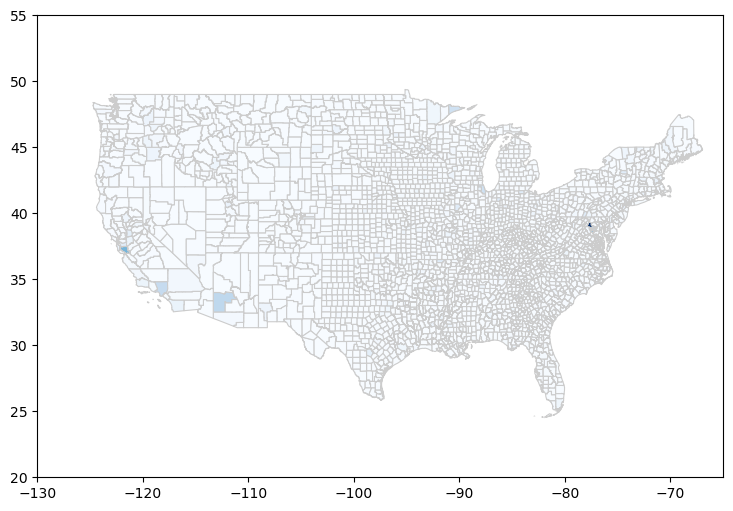

In [27]:
variable = 'Count'

vmin, vmax = 1, 5

fig, ax = plt.subplots(1, figsize=(10, 6))

ax.set_xlim(-130, -65)
ax.set_ylim(20, 55)

merged.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

Checking my work...

In [29]:
print(len(counts_df))

217


In [30]:
print(len(merged))

3401


Well... that means that according to the Business Insider data, less than 1% of counties in the US have data centers. Which is good! But not good for this map. I don't get a lot of information from this.

I could go by the power consumed, but that runs into the same issue (of not having a lot of counties highlighted). I could map out each individual data center, which would be impactful because Loudoun VA has 176 data centers, which is a huge amount: a high density of dots or a large circle could be really impactful. But my data does not include the latitude and longitude or any locational data about the cells.

In [33]:
merged = merged.sort_values(by='Count', ascending = False)

merged.head()

,STATEFP,COUNTYFP,COUNTYNS,AFFGEOID,GEOID,LSAD,ALAND,AWATER,geometry,state,State,Count
NAME,,,,,,,,,,,,
Loudoun,51,107,01480141,0500000US51107,51107,06,1335828238,14421373,"POLYGON ((-77.96204 39.01393, -77.9564 39.0208...",VA,VA,176.0
Santa Clara,06,085,00277307,0500000US06085,06085,06,3343896477,33589866,"POLYGON ((-122.20265 37.36305, -122.20163 37.3...",CA,CA,83.0
Prince William,51,153,01480161,0500000US51153,51153,06,869562682,30888500,"MULTIPOLYGON (((-77.48114 38.75611, -77.47772 ...",VA,VA,77.0
Maricopa,04,013,00037026,0500000US04013,04013,06,23825949527,64236947,"POLYGON ((-113.33438 33.48526, -113.33346 33.5...",AZ,AZ,48.0
Fairfax,51,600,01789070,0500000US51600,51600,25,16162729,84155,"POLYGON ((-77.3348 38.85383, -77.33333 38.8564...",VA,VA,45.0


In [34]:
merged.plot(column='Count', cmap='Reds', linewidth=0.4, ax=ax)

<Axes: >

In [35]:
# Reproject to a US-centered projection (ESRI:102003 is common for the entire US)
merged_projected = merged.to_crs("ESRI:102003")

In [36]:
# Determine an appropriate scaling factor
# This factor will depend on the range of your 'value' data and the map's scale
scaling_factor = 3000  # Adjust as needed

# Create a new GeoDataFrame for the circles
gdf_circles = merged_projected.copy()

# Create a new 'geometry' column with circles (buffers) around the centroids
# The buffer size (radius) is determined by the 'value' column * scaling_factor
gdf_circles['geometry'] = gdf_circles.centroid.buffer(gdf_circles['Count'] * scaling_factor)

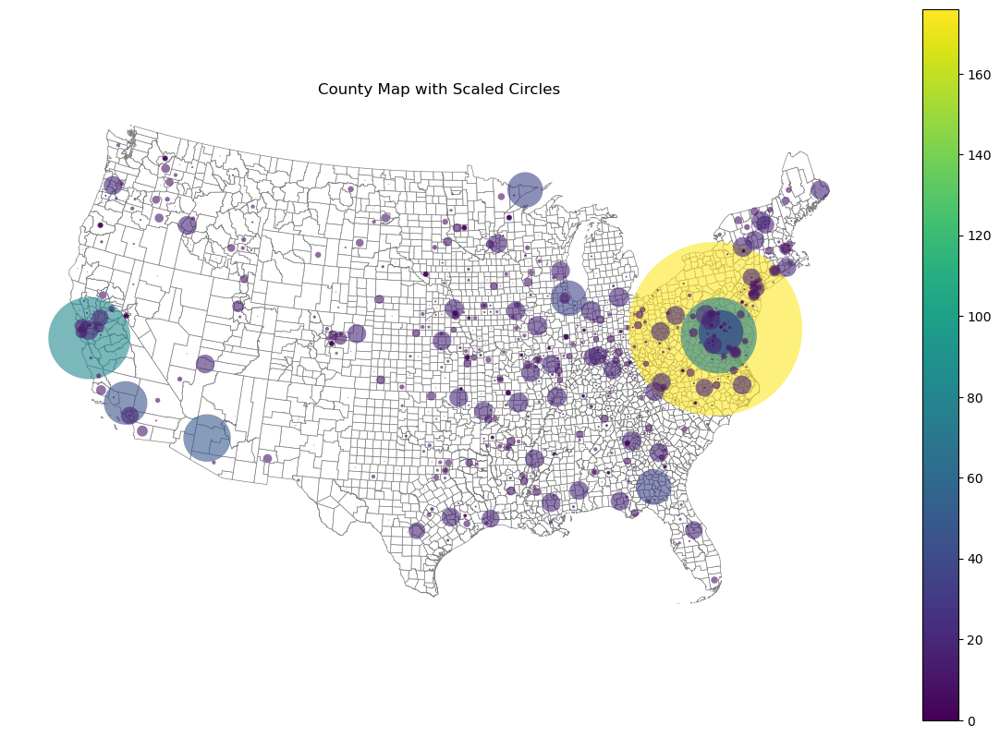

In [37]:
# Create a figure and axis
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the original county polygons (e.g., with a light color or outline)
merged_projected.plot(ax=ax, color='white', edgecolor='gray', linewidth=0.5)

# Plot the scaled circles on top
# You can color-code the circles based on the same 'value' column
gdf_circles.plot(ax=ax, column='Count', cmap='viridis', alpha=0.6, legend=True,
                 markersize=50) # markersize can be used if plotting points

# Customize the plot
ax.set_title('County Map with Scaled Circles')
ax.set_axis_off() # Optional: turn off axis lines

plt.show()

In [38]:
df['High'] = pd.to_numeric(df['High'], errors='coerce')

In [39]:
elec_df = df.groupby('NAME', as_index=False)['High'].sum()
elec_df.head()

,NAME,High
0,Accomack,0.0
1,Ada,0.0
2,Adams,0.0
3,Alameda,4640.0
4,Allegheny,0.0


In [40]:
merged_elec = map_df.set_index('NAME').join(elec_df.set_index('NAME'))

In [41]:
merged_projected_elec = merged_elec.to_crs("ESRI:102003")

In [42]:
scaling_factor_elec = 30  # Adjust as needed

# Create a new GeoDataFrame for the circles
gdf_circles_elec = merged_projected_elec.copy()

# Create a new 'geometry' column with circles (buffers) around the centroids
# The buffer size (radius) is determined by the 'value' column * scaling_factor
gdf_circles_elec['geometry'] = gdf_circles_elec.centroid.buffer(gdf_circles_elec['High'] * scaling_factor_elec)

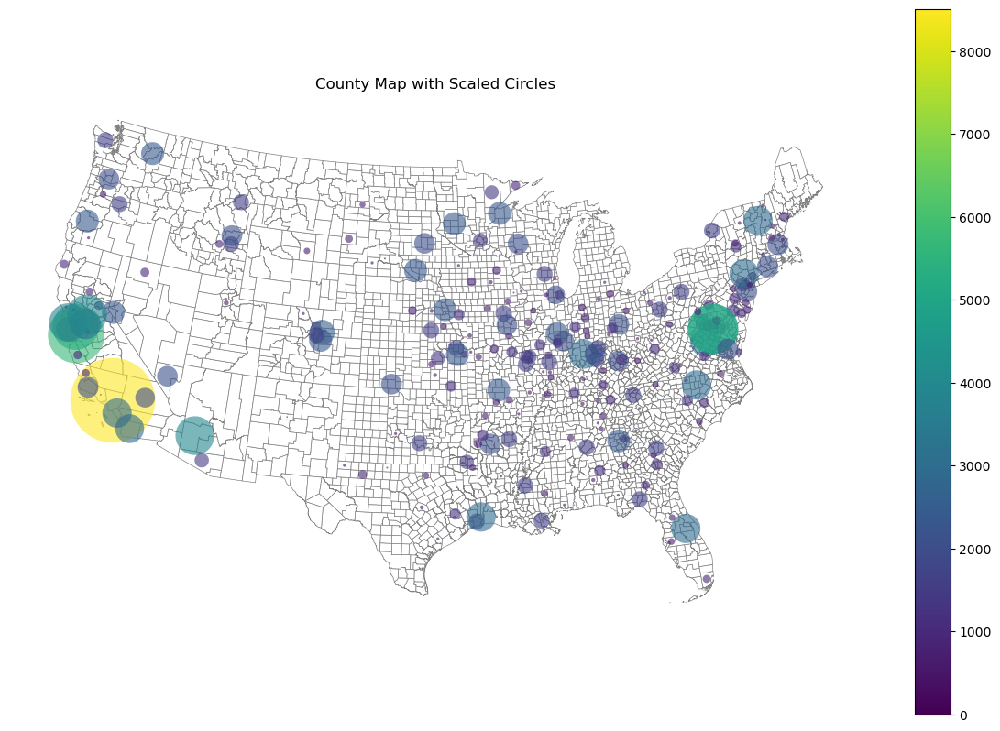

In [43]:
fig, ax = plt.subplots(figsize=(15, 10))

# Plot the original county polygons (e.g., with a light color or outline)
merged_projected_elec.plot(ax=ax, color='white', edgecolor='gray', linewidth=0.5)

# Plot the scaled circles on top
# You can color-code the circles based on the same 'value' column
gdf_circles_elec.plot(ax=ax, column='High', cmap='viridis', alpha=0.6, legend=True,
                 markersize=50) # markersize can be used if plotting points

# Customize the plot
ax.set_title('County Map with Scaled Circles')
ax.set_axis_off() # Optional: turn off axis lines

plt.show()

In [44]:
merged_projected_true = merged.to_crs("ESRI:102003")

merged_projected_true['True'] = np.where(
    merged_projected_true['Count'] == 0, 0, np.where(
    merged_projected_true['Count'] >  0, 1, -1))

<Axes: >

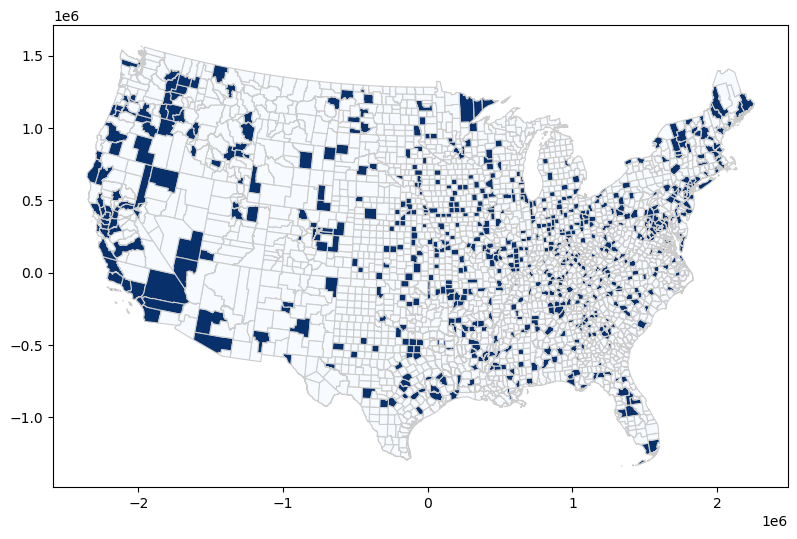

In [45]:
variable = 'True'

vmin, vmax = 1, 5

fig, ax = plt.subplots(1, figsize=(10, 6))

merged_projected_true.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.8')

In [96]:
divider = make_axes_locatable(ax)

cax = divider.append_axes("bottom", size="5%", pad=0.1)

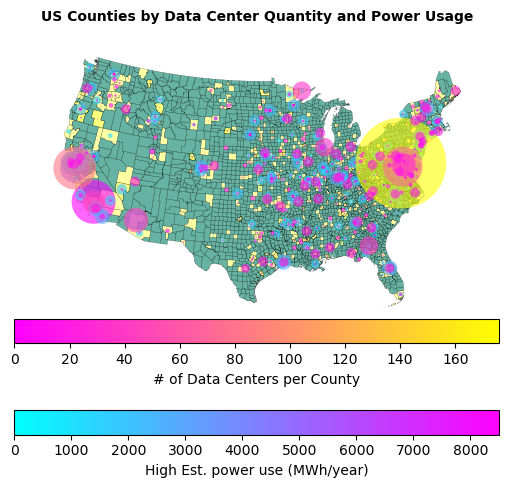

In [100]:
fig, ax = plt.subplots(figsize=(10, 5))

merged_projected_true.plot(ax=ax, column ='True', cmap='summer', alpha=0.6, edgecolor='black', linewidth=0.2,)

gdf_circles_elec.plot(ax=ax, column='High', cmap='cool', alpha=0.6, legend=True, legend_kwds={"label": "High Est. power use (MWh/year)", "orientation": "horizontal", 'shrink': 0.5, 'pad': 0.1},
                 markersize=50)

gdf_circles.plot(ax=ax, column='Count', cmap='spring', alpha=0.6, legend=True, legend_kwds={"label": "# of Data Centers per County", "orientation": "horizontal", 'shrink': 0.5, 'pad': 0},
                 markersize=50)

ax.set_title('US Counties by Data Center Quantity and Power Usage', weight="bold", fontsize=10)
ax.set_axis_off()

plt.tight_layout()
###plt.savefig("counties_final_2.png", dpi=10, bbox_inches='tight')
plt.show()

Because of the limitations of this project, I had to export the graph with a dpi of 10. This made it very small so it would be ~15 pages. Exporting it with a DPI of 300 resulted in a doc with around 3 million characters, which is far from feasible for a zine.

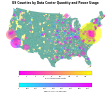

Next up was to work on the formatting of the book. I was unsure of how I wanted to design it, but I went into this project wanting to use the risograph. I thought that a glitched image would look beautiful printed on the riso, so I decided to go that route (even though I ended up deciding against the riso because of the length of the book).

My first idea was to corrupt images with code. I wanted to avoid using something like a photoshop filter to continue the message of it. I found a python script online (databend.py) that uses a command line interface to edit images. There are a lot of different results, depending on the commands or the file type of the image.

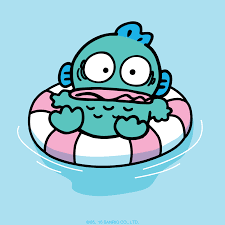

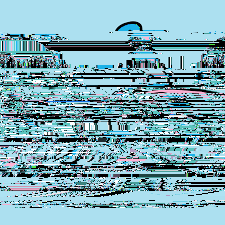

I liked the results that you get, but it took a lot of fiddling to get "good" results. Inputting the command with text and waiting to see the results created a distance between the process and the result that I didn't enjoy.

Another way to corrupt images is by editing the text file directly. Because of the messaging of the book of using the way images are read as a way of storing information, I decided I wanted to pursue this. I'm currently reading Digital Degrowth: Radically Rethinking our Digital Futures by Neil Selwyn. I found an article of his from 2021 where he compiles a [list of ecological distasters caused by data centers] (https://criticaledtech.com/2021/06/09/the-finiteness-fragility-of-the-digital-age/). I decided to intersplice these headlines within the code of the images to use the image to transport the message.

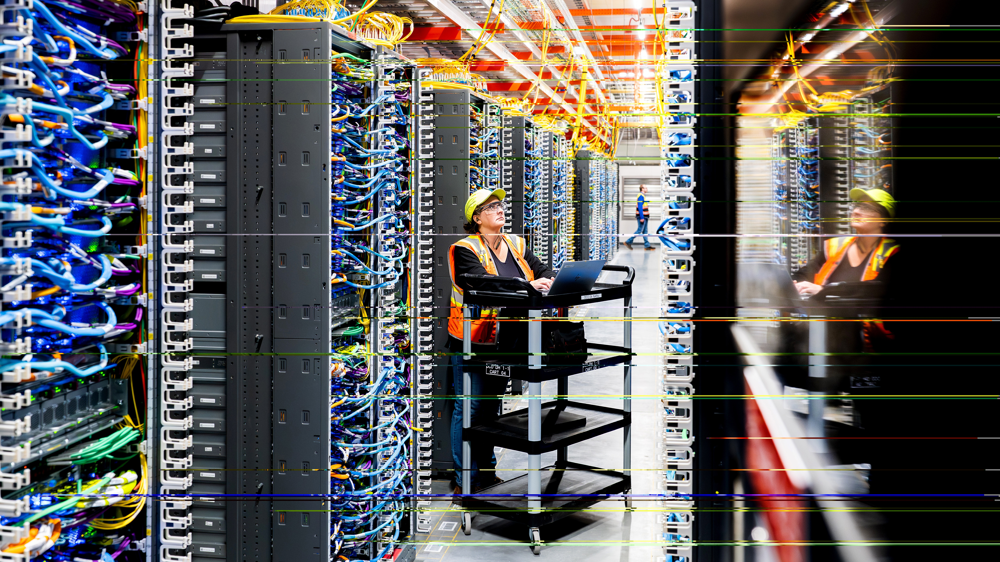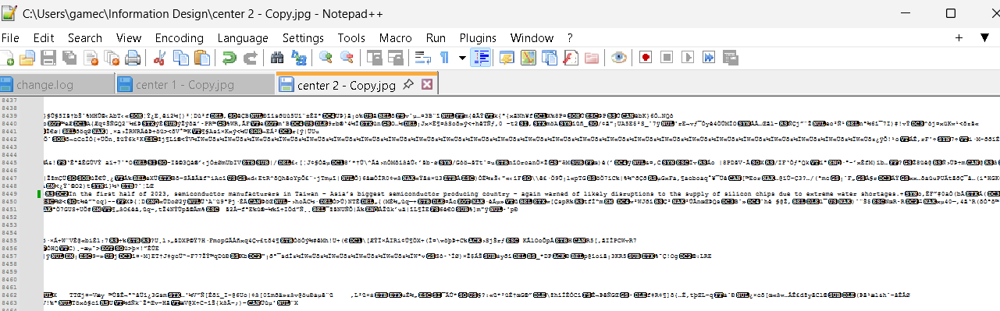

Interestingly enough, to get the image to be in a state that it can be imported into Illustrator, I had to open it in MS Paint and save it. Then reopening it in Notepad to edit it, the strings were no longer present. So by saving the image the message couldn't be transmitted anymore... but *I* know what I did.

Because the methodology involves experimentation, I don't have many progress pictures of the full book. Each spread was made in one pass, with minimal alterations after. Rather than incrementally editing, I tried to work with the process. Within the spreads, the effects are only created with the glitched images and different blending modes within InDesign (with the exception of one white overlay to lighten it enough to be readable). The only thing edited after the initial creation was the typesetting of the cover.

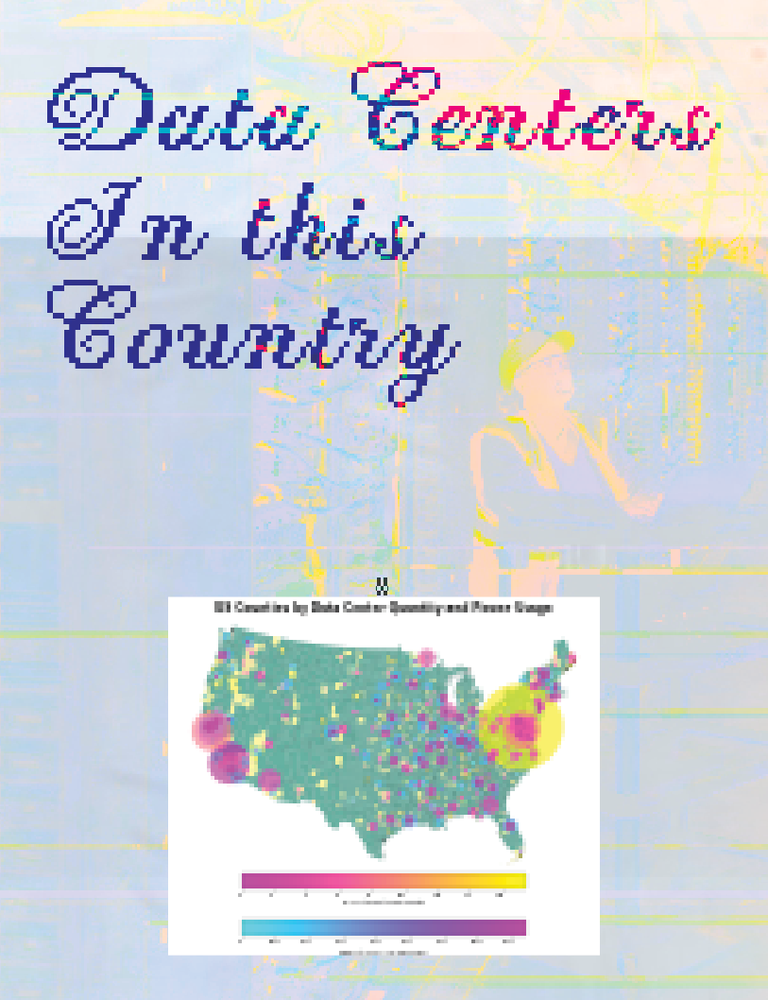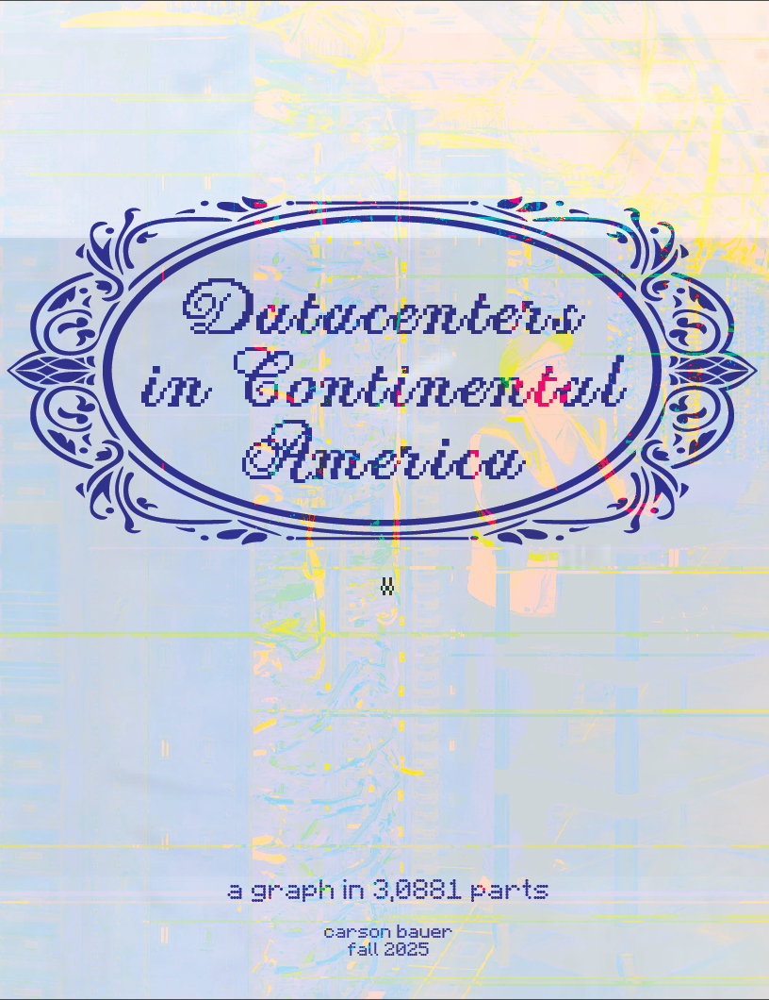

One thing I was undecided on was how to incorporate the map into the final product. I felt that including it at the very end was suitable: you had to "read" the entire book to get to the back cover, where the final image was housed, just like a computer reads all data before rendering an image. I initially wanted to include the 10 dpi rendering, but found it difficult to incorporate an image with a white background into something so visually active. For the back cover, I initially planned to have it as entirely plain, but at the eleventh hour, decided to include a frame to mirror the front cover. I like the ornate frames in contrast with the brashness of the digital articfacts, mirroring antique books.

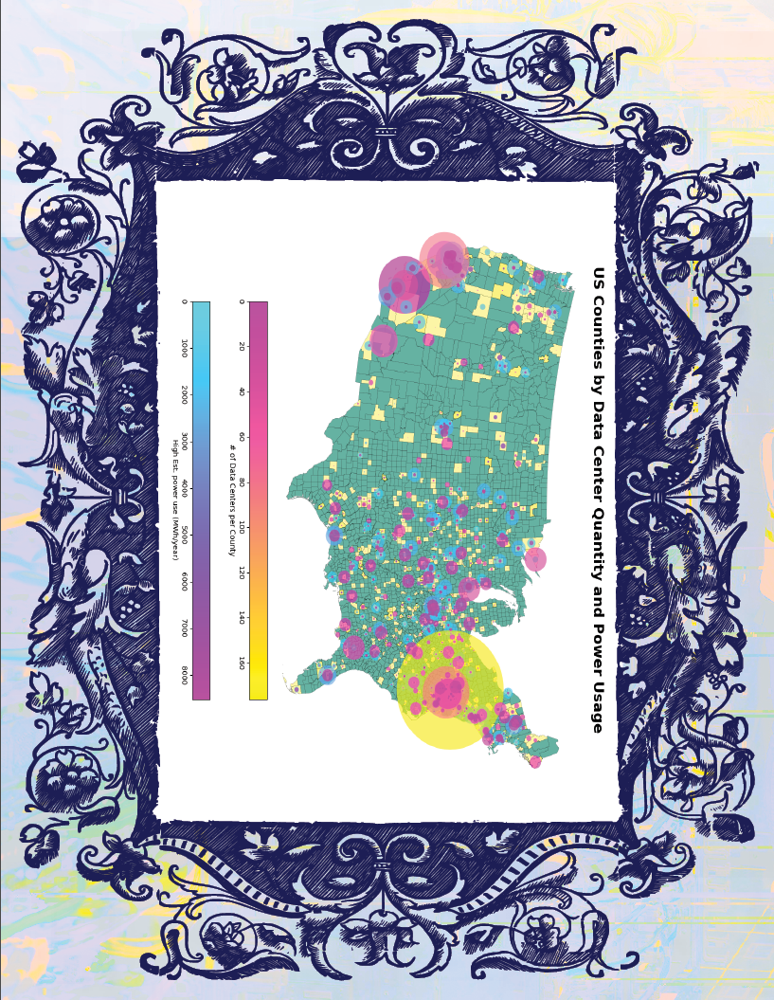

All of the edited images are available on the GitHub repository, where the edited data should (hopefully) still be intact, alongside the PDF of the final book.

Expanding on this project, I would want to redesign the map (the limited color palettes with a map this complicated is not very appealing, and I think more work could be done to make the scale logical). I would also love to expand the scope, and not have to compress the image so much in order to make the page count feasible. Overall, I think I achieved my goal with this project.